In [2]:
!pip install -r requirements.txt
#torch==2.5.1+cu121
#torchaudio==2.5.1+cu121
#torchvision==0.20.1+cu121

In [3]:

!pip install torch
!pip install torchaudio
!pip install torchvision
!pip install plotly
!pip install cv2

ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [4]:
!pip install opencv-python

In [5]:
import sys
import os

sys.path.append(os.path.expanduser("~/Desktop/For_Generator"))

In [6]:
!pip install plotly


In [7]:
!pip install opencv-python 

In [8]:
import sys
sys.path.append("/home/alexus/Desktop/For_Generator/kemsekov_torch/__pycache__/.venv/lib/python3.12/site-packages/debugpy")
from common import *

/home/alexus/Desktop/For_Generator/kemsekov_torch/__pycache__/.venv/lib/python3.12/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [9]:
import torchvision.transforms as T
import numpy as np
import torch
from common import *
#from common import r2_loss
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
import PIL
import PIL.Image
import cv2
from kemsekov_torch.positional_emb import PositionalEncodingPermute
from matplotlib import pyplot as plt

pio.templates.default = "plotly_dark"
plt.style.use('dark_background')


In [10]:

def create_cylinder(p0, p1, r0, r1, resolution=20):
    """
    Create a cylinder mesh between two points with specified radii.

    Args:
        p0 (array-like): Starting point [x, y, z].
        p1 (array-like): Ending point [x, y, z].
        r0 (float): Radius at the starting point.
        r1 (float): Radius at the ending point.
        resolution (int): Number of segments around the circumference.

    Returns:
        vertices (np.ndarray): Array of vertex coordinates.
        faces (list of tuples): List of triangular faces (indices into vertices).
    """
    p0 = np.array(p0)
    p1 = np.array(p1)
    # Vector from p0 to p1
    v = p1 - p0
    v = v / np.linalg.norm(v)
    
    # Create two vectors orthogonal to v
    if (v == np.array([0, 0, 1])).all():
        ortho1 = np.array([1, 0, 0])
    else:
        ortho1 = np.cross(v, [0, 0, 1])
        ortho1 /= np.linalg.norm(ortho1)
    ortho2 = np.cross(v, ortho1)
    
    # Angles for the circle
    theta = np.linspace(0, 2 * np.pi, resolution, endpoint=False)
    
    # Create circle at p0
    circle0 = [p0 + r0 * (np.cos(t) * ortho1 + np.sin(t) * ortho2) for t in theta]
    # Create circle at p1
    circle1 = [p1 + r1 * (np.cos(t) * ortho1 + np.sin(t) * ortho2) for t in theta]
    
    # Combine vertices
    vertices = np.vstack((circle0, circle1))
    
    # Create faces
    faces = []
    for i in range(resolution):
        next_i = (i + 1) % resolution
        # Triangle 1
        faces.append((i, next_i, resolution + i))
        # Triangle 2
        faces.append((next_i, resolution + next_i, resolution + i))
    
    return vertices, faces

def create_tube(centerline, radius, resolution=20):
    """
    Create a tube mesh from a centerline and varying radii.

    Args:
        centerline (List[List[float]]): List of [x, y, z] coordinates.
        radius (List[float]): List of radii corresponding to each centerline point.
        resolution (int): Number of segments around the circumference.

    Returns:
        all_vertices (np.ndarray): Array of all vertex coordinates.
        all_faces (List[Tuple[int, int, int]]): List of all triangular faces.
    """
    all_vertices = []
    all_faces = []
    vertex_offset = 0

    for i in range(len(centerline) - 1):
        p0 = centerline[i]
        p1 = centerline[i + 1]
        r0 = radius[i]
        r1 = radius[i + 1]
        
        vertices, faces = create_cylinder(p0, p1, r0, r1, resolution)
        all_vertices.append(vertices)
        # Adjust face indices
        adjusted_faces = [(a + vertex_offset, b + vertex_offset, c + vertex_offset) for a, b, c in faces]
        all_faces.extend(adjusted_faces)
        vertex_offset += vertices.shape[0]
    
    all_vertices = np.vstack(all_vertices)
    return all_vertices, all_faces
def render_sample(sample,title='3D Tube Visualization with Centerline and Varying Radii'):
    meshes = []
    for branch in sample:
        # Define your centerline and radii
        centerline = branch[:,:3]
        radius = branch[:,3]

        # Create the tube mesh
        vertices, faces = create_tube(centerline, radius, resolution=20)

        # Extract x, y, z coordinates
        x, y, z = vertices[:, 0], vertices[:, 1], vertices[:, 2]

        # Create lists of I, J, K for Mesh3d
        I = [face[0] for face in faces]
        J = [face[1] for face in faces]
        K = [face[2] for face in faces]

        # Create the mesh
        mesh = go.Mesh3d(
            x=x,
            y=y,
            z=z,
            i=I,
            j=J,
            k=K,
            color='lightblue',
            opacity=0.6,
            name='Tube'
        )

        # Create the centerline scatter
        center_x = [point[0] for point in centerline]
        center_y = [point[1] for point in centerline]
        center_z = [point[2] for point in centerline]

        scatter = go.Scatter3d(
            x=center_x,
            y=center_y,
            z=center_z,
            mode='lines+markers',
            line=dict(color='red', width=4),
            marker=dict(size=1, color='red'),
            name='Centerline'
        )
        meshes.append(mesh)
        meshes.append(scatter)

    # Define the layout
    layout = go.Layout(
        title=title,
        scene=dict(
            xaxis=dict(title='X'),
            yaxis=dict(title='Y'),
            zaxis=dict(title='Z'),
            aspectmode='data'
        ),
        legend=dict(x=0.7, y=0.9),
        width=700,
        height=700
    )   

    # Create the figure and add traces
    fig = go.Figure(data=meshes, layout=layout)

    # Show the figure
    fig.show()

def crop_to_content(image: torch.Tensor, alpha_threshold: float = 0.1) -> torch.Tensor:
    # Extract the alpha channel
    alpha = image[-1, :, :]

    # Create a binary mask where alpha is above the threshold
    mask = alpha > alpha_threshold

    # Find the bounding box of the content
    non_zero_indices = mask.nonzero(as_tuple=False)
    if non_zero_indices.numel() == 0:
        # If there's no content, return the original image
        return image

    y_min, x_min = non_zero_indices.min(dim=0)[0]
    y_max, x_max = non_zero_indices.max(dim=0)[0]

    # Crop the image to the bounding box
    cropped_image = image[:, y_min:y_max + 1, x_min:x_max + 1]

    return cropped_image


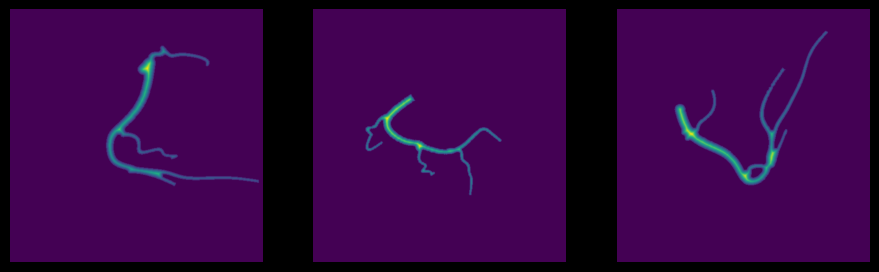

In [ ]:
import random

class GeneratedDataset(torch.utils.data.Dataset):
    #projections_order определяет спиоск проекций на 1 3дшку
    def __init__(self,images_dir,labels_dir,images_transform = None,projections_order = ['a','b','c']):
        super().__init__()

        labels = os.listdir(labels_dir)
        index_to_label = {i.split('.')[0]:os.path.join(labels_dir,i) for i in labels}

        images = os.listdir(images_dir)
        image_labels = [i.split("image")[1].split(".")[0] for i in images]

        data={}
        for image,label in zip(images,image_labels):
            label_index = label[:-1]
            label_letter = label[-1]
            if label_index not in data:
                data[label_index]={}
            data[label_index][label_letter]= os.path.join(images_dir,image)
        # data
        for i in index_to_label:
            row = data[i]
            row['label']=index_to_label[i]
            projections=[]
            for p in projections_order:
                projections.append(row[p])
                row.pop(p)
            row['projections']=projections
        self.data = data
        self.keys = list(self.data.keys())
        if images_transform is None:
            images_transform= lambda x: T.ToTensor()(x)
        self.images_transform=images_transform
    def __len__(self):
        return len(self.keys)
    def __getitem__(self, index):
        key = self.keys[index]
        row = self.data[key]
        label = np.load(row['label'])
        images = [PIL.Image.open(v) for v in row['projections']]
        
        label=torch.tensor(label)
        images = [self.images_transform(i) for i in images]
        images = torch.concat(images)

        return images,label
    
# Сюда нужно запихнуть путь к сгенерированным через генератор данные
#labels_dir = "_data/generated/train/labels/train/"
#images_dir = "_data/generated/train/images/train/"

labels_dir = "/home/alexus/Desktop/For_Generator/data/test/labels/test"
images_dir = "/home/alexus/Desktop/For_Generator/data/test/images/test"

def add_pos_encoding(image):
    pos = PositionalEncodingPermute(3)(torch.zeros([1,3]+list(image.shape[-2:])))[0].mean(dim=0)[None,:]
    image = torch.concat([pos,image])
    # image=crop_to_content(image,alpha_threshold=0.5)
    return image.mean(dim=0)[None,:]

def mean_channel(x):
    return x.mean(axis=0)[None,:]

def distance_transform(image_mask):
    image_mask=np.asarray(image_mask)[0]
    # Ensure the mask is binary
    binary_mask = (image_mask > np.mean(image_mask)).astype(np.uint8)
    # Apply the distance transform
    distance = cv2.distanceTransform(binary_mask, cv2.DIST_L2, 5)
    return torch.tensor(image_mask+distance[None,:])

images_transform=T.Compose([
    T.ToTensor(),
    T.Lambda(mean_channel),
    # T.Lambda(add_pos_encoding),
    # T.Lambda(lambda x: crop_to_content(x,0.5)),
    # T.CenterCrop((400,400)),
    
    T.Resize((512,512)),
    T.Lambda(distance_transform),
])
d = GeneratedDataset(images_dir,labels_dir,images_transform=images_transform)

sample_index = random.randint(0,len(d)-1)
sample = d[sample_index]
plt.figure(figsize=(15,15))
plt.subplot(1,4,1)
plt.imshow(sample[0][0])
plt.axis('off')
plt.subplot(1,4,2)
plt.imshow(sample[0][1])
plt.axis('off')
plt.subplot(1,4,3)
plt.imshow(sample[0][2])
plt.axis('off')

#render_sample(np.asarray(sample[1]))
render_sample(np.array([
    []
]))

In [17]:
sample[1]

tensor([[[-4.9968e+01,  1.0022e+01,  1.7811e-03,  2.2913e-03],
         [-4.9969e+01,  1.0021e+01,  2.0723e-03,  2.2769e-03],
         [-4.9969e+01,  1.0021e+01,  2.3558e-03,  2.2794e-03],
         ...,
         [-4.9951e+01,  1.0022e+01, -5.2281e-02,  8.0333e-04],
         [-4.9950e+01,  1.0022e+01, -5.2609e-02,  7.9515e-04],
         [-4.9950e+01,  1.0021e+01, -5.2947e-02,  8.0297e-04]],

        [[ 1.0002e+02,  1.0003e+02,  7.2909e-03,  1.0580e-03],
         [ 1.0002e+02,  1.0003e+02,  7.4549e-03,  1.0375e-03],
         [ 1.0002e+02,  1.0003e+02,  7.6149e-03,  1.0496e-03],
         ...,
         [ 1.0004e+02,  1.0001e+02,  7.1848e-03,  6.5858e-04],
         [ 1.0004e+02,  1.0001e+02,  7.0608e-03,  6.4310e-04],
         [ 1.0004e+02,  1.0001e+02,  6.9349e-03,  6.4588e-04]],

        [[ 1.0001e+02,  1.0002e+02, -1.8002e-02,  1.0488e-03],
         [ 1.0001e+02,  1.0002e+02, -1.8180e-02,  1.0420e-03],
         [ 1.0001e+02,  1.0002e+02, -1.8353e-02,  1.0343e-03],
         ...,
         

In [13]:
!pip install scikit-learn


In [14]:
# split dataset
from sklearn.model_selection import train_test_split
from kemsekov_torch.train import EpochSplittedDataloader
from torch.utils.data import DataLoader, Subset


train_idx, test_idx = train_test_split(
    list(range(len(d))),
    test_size=0.05,
    random_state=123
)

train_data = Subset(d, train_idx)
test_data = Subset(d, test_idx)

# play around with it to find out if you can set num
num_workers = 16
prefetch_factor=4
batch_size=4
# how many batches to prepare in advance
train_loader = EpochSplittedDataloader(train_data,batch_size,8)

test_loader = DataLoader(
    test_data,
    batch_size=batch_size, 
    shuffle=False,
    num_workers=num_workers,
    prefetch_factor=prefetch_factor
)

In [15]:
from kemsekov_torch.residual import ResidualBlock
from kemsekov_torch.resunet import *
from kemsekov_torch.ittr import HPB
import torchvision.models as models
import math
import copy

class VesselNetwork(nn.Module):
    def __init__(self, backbone, branches, discretization,prediction_size):
        super().__init__()
        self.backbone= copy.deepcopy(backbone)
        self.branches = branches
        self.discretization = discretization
        self.prediction_size = prediction_size

        centerline_mlp_hidden_dim = branches*discretization*prediction_size

        output_size = 4096*2

        self.centerline_mlp = nn.Sequential(
            nn.Linear(output_size,4096),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(4096,centerline_mlp_hidden_dim)
        )
    def forward(self,x):
        #x is of shape
        # [batch_size,images_count,256,256]
        batch_size = x.shape[0]

        # x_reshaped = x.view([-1]+list(x.shape[-3:]))
        emb=self.backbone(x)
        emb = emb.flatten(1)
        batch_size = x.shape[0]
        new_shape=(batch_size,self.branches,self.discretization,self.prediction_size)
        return self.centerline_mlp(emb).reshape(new_shape)

# model = torch.jit.load("checkpoints/resunet-filter-dropout-scse//model.pt").cpu()
# # get encoder
# enc = [e for e in model.modules() if e.original_name=="Encoder"][0]
# resnet = models.resnet101(pretrained=True)
# resnet = torch.nn.Sequential(*list(resnet.children())[:-1])

# кол-во веток
branches = 4
# размер одной ветки
discretization=200

prediction_size=3 # x y z

# как много проекций на 1 3дшку
projections_count=3

enc = ResidualUnet(projections_count,3,dropout_p=0.1,attention=nn.Identity).encoder
enc = nn.Sequential(
    enc,
    HPB(512,512,heads=16,attn_dropout=0.1,ff_dropout=0.1),
    HPB(512,512,heads=16,attn_dropout=0.1,ff_dropout=0.1),
    nn.AdaptiveAvgPool2d((4,4))
)

centerline_model= VesselNetwork(enc,branches,discretization,prediction_size)
prediction_size=1 # r
radius_model= VesselNetwork(enc,branches,discretization,prediction_size)

# 10 sets with each set consists of 3 images
three_segmentations = torch.randn((10,3,512,512))
# result is 10 sets, each set have 4 branches, each branch have 200 points with centerline xyz positions
centerline_model(three_segmentations).shape

model_size = sum([math.prod(v.shape) for v in centerline_model.parameters()])
print("parameters",model_size)
print("kilo parameters",model_size/1024)
print("mega parameters",model_size/1024/1024 )

parameters 87130950
kilo parameters 85088.818359375
mega parameters 83.09454917907715


In [16]:
print("Batch[1] shape before slicing:", batch[1].shape)


NameError: name 'batch' is not defined

In [ ]:
from kemsekov_torch.train import train
import torch.nn.functional as F  # интерполяция для уменьшения размерности лейблов 

def curve_length(X):
    # Compute the differences between consecutive points along each curve
    differences = X[:, 1:, :] - X[:, :-1, :]

    # Calculate the Euclidean distances (norms) between consecutive points
    segment_lengths = torch.norm(differences, dim=2)

    # Sum the segment lengths to get the total length of each curve
    curve_lengths = torch.sum(segment_lengths, dim=1)

    return curve_lengths

branch_length_importance = 0.1
lossf = lambda x,y: torch.mean((x-y)**2)/(torch.mean(y*y)+1e-8)
lossf = r2_loss

import torch.nn.functional as F

def compute_loss_and_accuracy(model, batch):
    images = batch[0].cuda()
    # Исходная форма лейблов: [B, branches, points, features] = [B, 4, 500, 3]
    labels = batch[1][:, :, :, :-1].cuda()

    # Для интерполяции нужно работать с форматом [N, C, L].
    # Сначала переставим оси так, чтобы ось точек оказалась последней в "канальном" измерении:
    # Из [B, 4, 500, 3] -> [B, 4, 3, 500]
    labels = labels.permute(0, 1, 3, 2)
    
    # Объединим измерения batch и branch, чтобы получить тензор формы [B*branches, C, L]
    B, branches, C, L = labels.shape
    labels = labels.reshape(B * branches, C, L)  # [B*branches, 3, 500]
    
    # Интерполируем вдоль оси длины (последняя ось) с 500 до 200 точек
    labels = F.interpolate(labels, size=200, mode='linear', align_corners=False)  # [B*branches, 3, 200]
    
    # Восстанавливаем исходные размерности: сначала разделяем batch и branch
    labels = labels.reshape(B, branches, C, 200)  # [B, 4, 3, 200]
    
    # Переставляем оси обратно, чтобы получить [B, 4, 200, 3]
    labels = labels.permute(0, 1, 3, 2)

    # Получаем предсказания модели, ожидаемая форма: [B, 4, 200, 3]
    pred = model(images)

    print("Prediction shape:", pred.shape)
    print("Resampled labels shape:", labels.shape)

    pred_branch_lengths = curve_length(pred)
    true_branch_lengths = curve_length(labels)
    print("Prediction branch lengths shape:", pred_branch_lengths.shape)
    print("True branch lengths shape:", true_branch_lengths.shape)

    loss = (1 - branch_length_importance) * lossf(pred, labels) + \
           branch_length_importance * lossf(pred_branch_lengths, true_branch_lengths)

    r2_pos = r2_score(pred.detach(), labels)
    r2_lengths = r2_score(pred_branch_lengths.detach(), true_branch_lengths)

    return loss, {
        'r2_pos': r2_pos,
        'r2_length': r2_lengths,
        'mean_r2': (r2_pos + r2_lengths) / 2
    }


save_dir="checkpoints/centerline"
load_checkpoint_dir = os.path.join(save_dir,"last")
print("starting training")

train(
    model=centerline_model,
    train_loader=train_loader,
    test_loader=test_loader,
    compute_loss_and_metric=compute_loss_and_accuracy,
    save_results_dir=save_dir,
    save_on_metric_improve=['mean_r2'],
    load_checkpoint_dir=load_checkpoint_dir,
    num_epochs=200
)

starting training
trying to capture model architecture...
Saved model architecture at checkpoints/centerline/model.pt. You can torch.load it and update it's weights with checkpoint
Failed to load state with error [Errno 2] No such file or directory: 'checkpoints/centerline/last/state/pytorch_model.bin'
Ignoring state loading...

Epoch 1/200


IndexError: tuple index out of range

In [ ]:
!rm -rf "checkpoints/radius"

In [ ]:
from kemsekov_torch.train import train

lossf = torch.nn.SmoothL1Loss()
# lossf = torch.nn.MSELoss()
lossf = lambda x,y: torch.mean((x-y)**2)/(torch.mean(y*y)+1e-8)
lossf = r2_loss
# lossf = lambda x,y: torch.mean((x-y)**2)

def compute_loss_and_accuracy(model,batch):
    # print("here")
    images = batch[0].cuda()
    
    # take radius part of labels
    labels = batch[1][:,:,:,[-1]].cuda()
    pred = model(images)

    loss = lossf(pred,labels)
    
    # loss = binary_cross_entropy(masks,pred)
    r2 = r2_score(pred.detach(),labels)
    
    return loss,{
        'r2':r2
    }

save_dir="checkpoints/radius"
load_checkpoint_dir = os.path.join(save_dir,"last")
print("starting training")
train(
    model=radius_model,
    train_loader=train_loader,
    test_loader=test_loader,
    compute_loss_and_metric=compute_loss_and_accuracy,
    save_results_dir=save_dir,
    load_checkpoint_dir=load_checkpoint_dir,
    num_epochs=200
)

starting training
trying to capture model architecture...
Saved model architecture at checkpoints/radius/model.pt. You can torch.load it and update it's weights with checkpoint
Failed to load state with error [Errno 2] No such file or directory: 'checkpoints/radius/last/state/pytorch_model.bin'
Ignoring state loading...

Epoch 1/200


IndexError: tuple index out of range

In [ ]:
from kemsekov_torch.train import load_checkpoint
centerline_model=torch.jit.load("checkpoints/centerline/model.pt")
centerline_model = load_checkpoint(centerline_model,"checkpoints/centerline",-1).eval().cpu()
radius_model=torch.jit.load("checkpoints/radius/model.pt").eval().cpu()
radius_model= load_checkpoint(radius_model,"checkpoints/radius",-1).eval().cpu()


spatial_t = list(list(radius_model.children())[0].children())[0]
input = test_data[2][0]
output = spatial_t(input[None,:])[0]

T.ToPILImage()(input[1])
# T.ToPILImage()(output[0])

ValueError: The provided filename checkpoints/centerline/model.pt does not exist

(4, 20, 3)


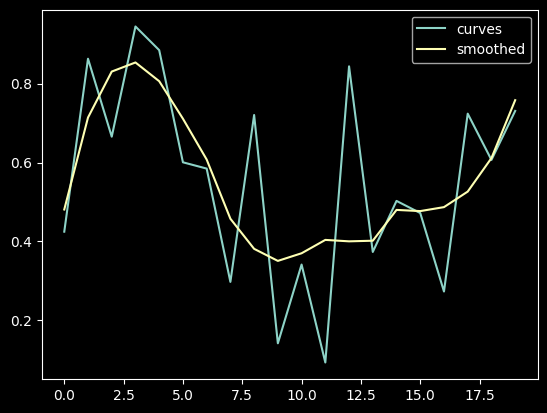

In [ ]:
import numpy as np
from sklearn.svm import SVR
from scipy.signal import savgol_filter
import numpy as np

def smooth_centerline_with_savgol(centerlines, window_length=11, polyorder=3):
    """
    Применяет фильтр Савицкого-Голея для сглаживания центральной линии.
    """
    dims = centerlines.shape[-1]
    smoothed_centerlines = []
    for centerline in centerlines:
        if len(centerline) < window_length:
            window_length = len(centerline) if len(centerline) % 2 == 1 else len(centerline) - 1

        smoothed_centerline = np.zeros_like(centerline)
        for i in range(dims):  # Для x, y, z
            smoothed_centerline[:, i] = savgol_filter(centerline[:, i], window_length=window_length, polyorder=polyorder)
        smoothed_centerlines.append(smoothed_centerline)
    return np.array(smoothed_centerlines)


# Example usage
curves = np.random.rand(4, 20, 3) # Replace with your actual data
smoothed_curves = smooth_centerline_with_savgol(curves)
print(smoothed_curves.shape)  # Should be (4, 1000, 3)
plt.plot(curves[0,:,0],label='curves')
plt.plot(smoothed_curves[0,:,0],label='smoothed')
plt.legend()

In [ ]:
from kemsekov_torch.train import load_checkpoint
centerline_model=torch.jit.load("checkpoints/centerline/model.pt")
centerline_model = load_checkpoint(centerline_model,"checkpoints/centerline",-1).eval().cpu()
radius_model=torch.jit.load("checkpoints/radius/model.pt").eval().cpu()
radius_model= load_checkpoint(radius_model,"checkpoints/radius",-1).eval().cpu()

ValueError: The provided filename checkpoints/centerline/model.pt does not exist

In [ ]:

sample_index = random.randint(0,len(test_data)-1)
sample = test_data[sample_index]

with torch.no_grad():
    centerline = centerline_model(sample[0][None,:])[0]
    radius = radius_model(sample[0][None,:])[0]
true_geometry = np.array(sample[1])
true_centerline = true_geometry[:,:,:-1]
true_radius = true_geometry[:,:,[-1]]

centerline_smooth=torch.tensor(smooth_centerline_with_savgol(centerline,3,2))
radius_smooth=torch.tensor(smooth_centerline_with_savgol(radius,3,2))

pred_geometry = np.array(torch.concat([centerline,radius_smooth],axis=-1))

# to ignore radius
# pred_geometry = np.array(torch.concat([centerline,torch.ones_like(radius)*0.0001],axis=-1))[0]

render_sample(true_geometry,"True geometry")
render_sample(pred_geometry,"Predicted geometry")

/tmp/ipykernel_13398/1283773178.py:7: DeprecationWarning:

__array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.

/tmp/ipykernel_13398/1283773178.py:14: DeprecationWarning:

__array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.



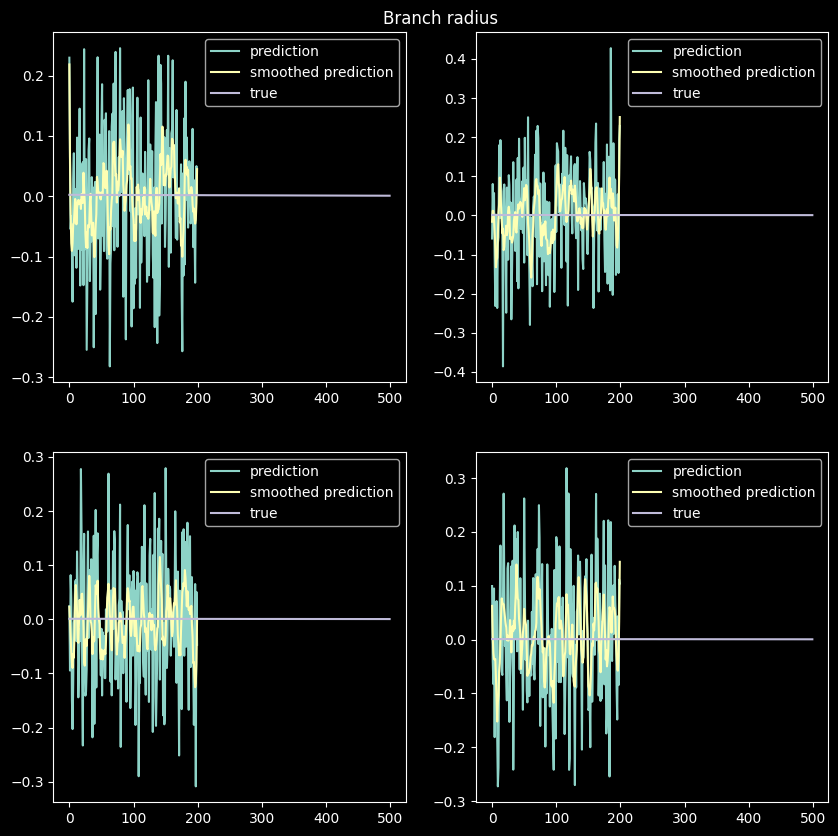

In [ ]:
radius_smooth=torch.tensor(smooth_centerline_with_savgol(radius))
branches_count = radius.shape[0]

plt.figure(figsize=(10,10))
plt.axis('off')
plt.title("Branch radius")
for b in range(branches_count):
    plt.subplot(2,2,b+1)
    plt.plot(radius[b,:,0],label="prediction")
    plt.plot(radius_smooth[b,:,0],label="smoothed prediction")
    plt.plot(true_radius[b,:,0],label="true")
    plt.legend()

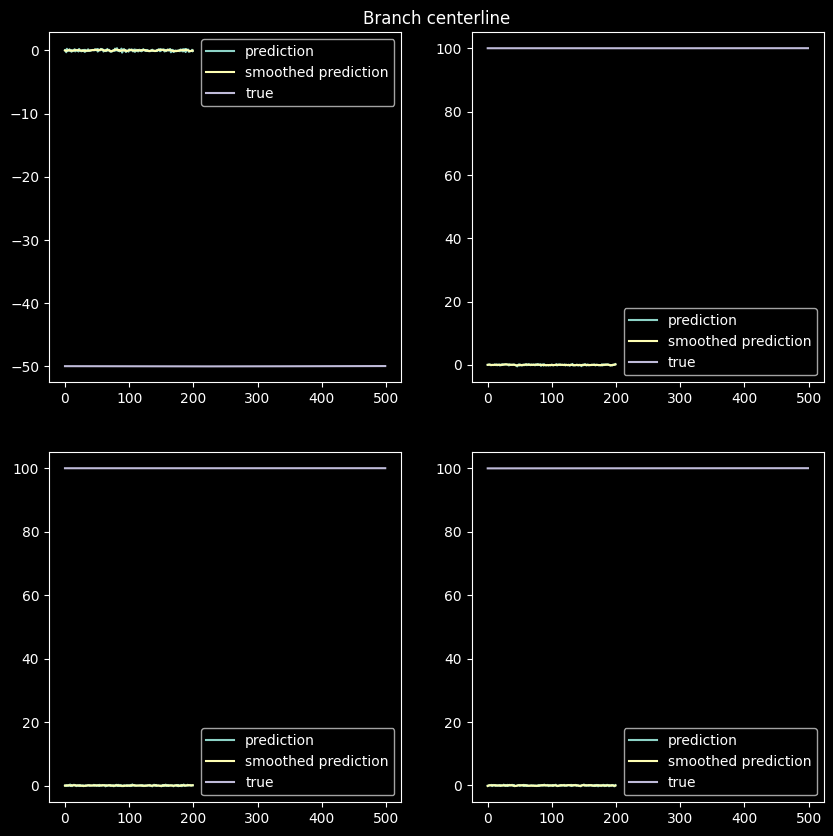

In [ ]:
centerline_smooth=torch.tensor(smooth_centerline_with_savgol(centerline))
branches_count = radius.shape[0]

plt.figure(figsize=(10,10))
plt.title("Branch centerline")
plt.axis('off')
for b in range(branches_count):
    plt.subplot(2,2,b+1)
    plt.plot(centerline[b,:,0],label="prediction")
    plt.plot(centerline_smooth[b,:,0],label="smoothed prediction")
    plt.plot(true_centerline[b,:,0],label="true")
    plt.legend()